---

#Final Team Project: Object Detection in Fashion

##Final Project Team 1 - AAI-521: Intro to Computer Vision

##Jason Raimondi, Abdul Shariq, and Kayla Wright

##2023-12-11

###Jason_RetinaNet.ipynb

###Data Source:

Kaggle - Colorful Fashion Dataset For Object Detection

https://www.kaggle.com/datasets/nguyngiabol/colorful-fashion-dataset-for-object-detection

###GitHub Repository:

https://github.com/jeraimondi/aai-cv-obj-detect-fashion

###References:

https://keras.io/api/keras_cv/

https://keras.io/api/keras_cv/models/

https://keras.io/api/keras_cv/models/tasks/retinanet/

https://keras.io/guides/keras_cv/object_detection_keras_cv/

---

# Environment Prep

## Install Required Packages

In [ ]:
!pip install --upgrade -q git+https://github.com/keras-team/keras-cv # keras cv

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## Load Required Libraries

In [ ]:
# ignore warnings during code execution
import warnings
warnings.filterwarnings('ignore')

import cv2 # computer vision
import keras_cv # computer vision
from keras_cv import bounding_box # convert format function
from keras_cv import visualization # gallery plotting
from keras_cv.layers import MultiClassNonMaxSuppression # non-max suppression
from keras_cv.metrics import BoxCOCOMetrics # custom metrics
import keras_core as keras # core keras
from keras.callbacks import ModelCheckpoint # save checkpoints during training
from keras.models import load_model # load model
import matplotlib.pylab as plt # plotting
import numpy as np # array manipulation
import random # random number generator
import shutil # file operations
import tensorflow as tf  # machine learning platform
from tensorflow.keras.optimizers import SGD # stochastic gradient descent
from tensorflow.keras.callbacks import Callback, LambdaCallback # custom callbacks
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau # training callbacks
from tensorflow.keras.utils import plot_model # plot model architecture
from google.colab import drive # connect to drive storage
from natsort import natsorted # natural sorting of numeric files
from os import listdir # get list of files/directories
from sklearn.model_selection import train_test_split # splitter function
from tqdm import tqdm # progress bars
from zipfile import ZipFile # dataset extraction

For reference, let's print the library versions.

In [ ]:
# print library versions
print('Library Versions:')
print('-----------------')
print('TensorFlow:', tf.__version__)
print('Keras Core:', keras.__version__)
print('KerasCV:', keras_cv.__version__)
print('OpenCV:', cv2.__version__)

Library Versions:
-----------------
TensorFlow: 2.14.0
Keras Core: 0.1.7
KerasCV: 0.8.0
OpenCV: 4.8.0


## Set Random Seeds

In [ ]:
# set global random seeds for reproducibility
seed = 1234
random.seed(seed)
np.random.seed(seed)

## Verify GPU Availability

In [ ]:
# set to True when using GPU
use_gpu = True

if use_gpu == True:
    # ensure GPU is available before proceeding
    device_name = tf.test.gpu_device_name()
    if device_name != '/device:GPU:0':
        raise SystemError('GPU device not found')
    print('Found GPU at: {}'.format(device_name))
elif use_gpu == False:
    print('Bypassing GPU check.')
    print('Set use_gpu to True if wanting to use GPU.')

Found GPU at: /device:GPU:0


# Data Exploration

## Upload and Extract Dataset

In [ ]:
# connect google drive
drive.mount('/content/drive') # uncomment to mount google drive
path_dataset_archive = '/content/drive/MyDrive/Colab Notebooks/Data/archive.zip'

# extract dataset from zipped archive
with ZipFile(path_dataset_archive, 'r') as myzip:
  myzip.extractall()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Display Sample Images from Dataset

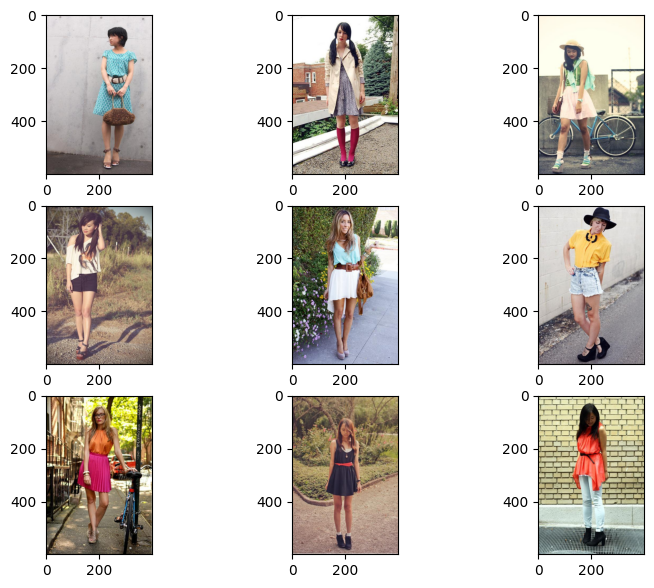

In [ ]:
# define paths
dir_data = '/content/colorful_fashion_dataset_for_object_detection/'
dir_img = dir_data + 'JPEGImages/'
dir_annotations = dir_data + 'Annotations_txt/'

# create file lists of images and annotations
list_of_images = natsorted(listdir(dir_img))
list_of_annotations =  natsorted([file for file in listdir(dir_annotations) if file != 'classes.txt'])

# check number of image and annotation files match
assert len(list_of_images) == len(list_of_annotations)

# create figure
fig=plt.figure(figsize=(9, 7))

# create subplots
for i in range(9): # first 9
    ax = plt.subplot(3, 3, i + 1)
    img = cv2.imread(dir_img + list_of_images[i]) # read image with OpenCV
    img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert to RGB color space
    plt.imshow(img_RGB)

# show figure
plt.show()

# Pre-Trained Model

## Images Before Inference

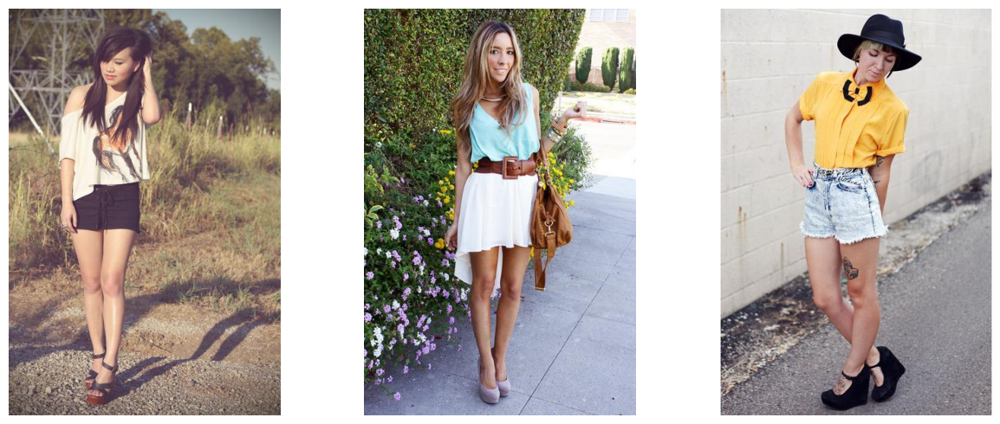

In [ ]:
# define bounding box format
bounding_box_format = 'XYXY'

# define model from preset config and weights
pt_model = keras_cv.models.RetinaNet.from_preset('retinanet_resnet50_pascalvoc', bounding_box_format=bounding_box_format)

# function to get samples of images converted to RGB
def get_image_samples(sample_size):
    image_samples = []
    for i in range(sample_size):
        img = cv2.imread(dir_img + list_of_images[i+3]) # read image with OpenCV
        img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert to RGB color space
        image_samples.append(img_RGB)
    return np.array(image_samples)

# call function to get batch of image samples
sample_size = 3
image_samples = get_image_samples(sample_size)

# plot image gallery
_ = visualization.plot_image_gallery(
    image_samples,
    value_range=(0, 255),
    rows=1,
    cols=sample_size,
    scale=5,
)

## Images After Inference

In [ ]:
# define pascalvoc class ids
class_ids = [
    "Aeroplane",
    "Bicycle",
    "Bird",
    "Boat",
    "Bottle",
    "Bus",
    "Car",
    "Cat",
    "Chair",
    "Cow",
    "Dining Table",
    "Dog",
    "Horse",
    "Motorbike",
    "Person",
    "Potted Plant",
    "Sheep",
    "Sofa",
    "Train",
    "Tvmonitor",
    "Total",
]

# define dictionary of class mappings
class_mapping = dict(zip(range(len(class_ids)), class_ids))

In [ ]:
# function to convert bounding boxes
# specify original format, 'YOLO' or 'PASCALVOC' for correct conversion
def convert_bbox(box, original_size, new_size, format='YOLO'):

    # obtain sizes of original and new image
    original_width, original_height = original_size
    new_width, new_height = new_size

    # calculate target dimensions while maintaining aspect ratio
    aspect_ratio_original = original_width / original_height
    target_width_by_height = new_height * aspect_ratio_original

    # calculate padding added in x dimension
    x_pad_size = new_width - target_width_by_height

    # calculate scaling factors
    x_scale = (new_width - x_pad_size) / original_width
    y_scale = new_height / original_height

    # Convert YOLO format to PASCALVOC (XYXY)
    if format == 'YOLO':
        # unpack box coordinates
        x, y, w, h = box

        # obtain coordinates
        xmin = int((x - w / 2) * original_width)
        ymin = int((y - h / 2) * original_height)
        xmax = int((x + w / 2) * original_width)
        ymax = int((y + h / 2) * original_height)

        # scale coordinates
        xmin = int(np.round(xmin * x_scale))
        ymin = int(np.round(ymin * y_scale))
        xmax = int(np.round(xmax * x_scale))
        ymax = int(np.round(ymax * y_scale))

        # return updated bbox
        return np.array([xmin, ymin, xmax, ymax])

    elif format == 'PASCALVOC':
        # unpack box coordinates
        rel_left, rel_top, rel_right, rel_bottom = box

        # convert to absolute coordinates based on original_size
        left = (rel_left / 100) * original_width
        top = (rel_top / 100) * original_height
        right = (rel_right / 100) * original_width
        bottom = (rel_bottom / 100) * original_height

        # convert to relative coordinates based on new_size
        new_left = (left / (new_width - x_pad_size/2)) * 100
        new_top = (top / new_height) * 100
        new_right = (right / (new_width - x_pad_size/2)) * 100
        new_bottom = (bottom / new_height) * 100

        # return updated bbox
        return np.array([new_left, new_top, new_right, new_bottom])

1/1 [==============================] - 4s 4s/step


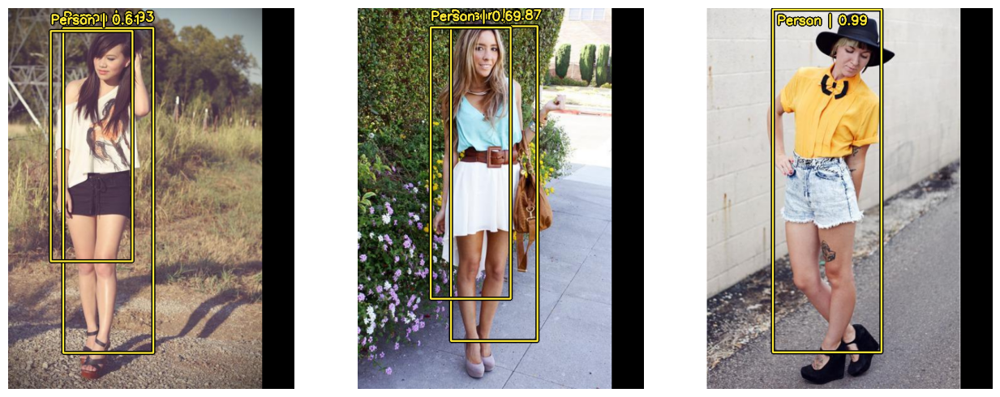

In [ ]:
# define original image size and new size
# resizing required by models
original_size = (400, 600)
new_size = (480, 640)

# resizing layer to resize and pad image
inference_resizing = keras_cv.layers.Resizing(
    new_size[1], new_size[0], pad_to_aspect_ratio=True, bounding_box_format=bounding_box_format
)

# create batch of images for inference
image_samples = inference_resizing(image_samples)

# perform inference
y_pred = pt_model.predict(image_samples)

# convert pascalvoc bboxes
y_pred['boxes'] = [
    [convert_bbox(box, original_size, new_size, format='PASCALVOC') for box in image]
    for image in y_pred['boxes']
]

# plot image gallery
_ = visualization.plot_bounding_box_gallery(
    image_samples,
    value_range=(0, 255),
    rows=1,
    cols=sample_size,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format=bounding_box_format,
    class_mapping=class_mapping,
)

## Inference Without NonMax Suppression

1/1 [==============================] - 2s 2s/step


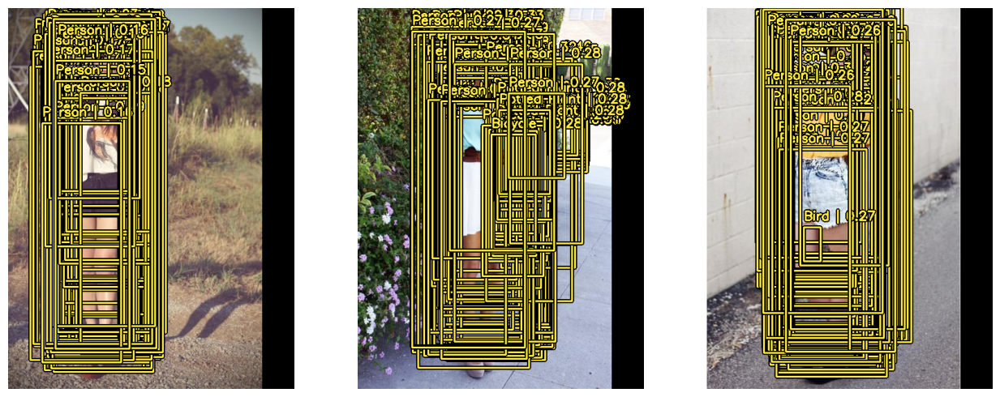

In [ ]:
# NonMaxSuppression (NMS) layer to disable NMS
prediction_decoder = MultiClassNonMaxSuppression(
    bounding_box_format=bounding_box_format,
    from_logits=True,
    iou_threshold=1.0,
    confidence_threshold=0.0,
)

# disable NMS for pre-trained model
pt_model.prediction_decoder = prediction_decoder

# perform inference
y_pred = pt_model.predict(image_samples)

# convert pascalvoc bboxes
y_pred['boxes'] = [
    [convert_bbox(box, original_size, new_size, format='PASCALVOC') for box in image]
    for image in y_pred['boxes']
]

# plot image gallery
_ = visualization.plot_bounding_box_gallery(
    image_samples,
    value_range=(0, 255),
    rows=1,
    cols=sample_size,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format=bounding_box_format,
    class_mapping=class_mapping,
)

## Inference With NonMax Suppression

1/1 [==============================] - 2s 2s/step


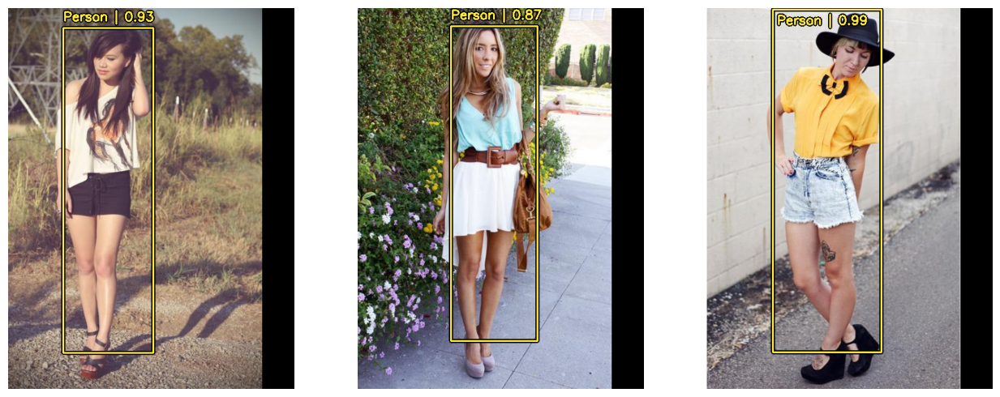

In [ ]:
# enable NMS, tune for best results
prediction_decoder = MultiClassNonMaxSuppression(
    bounding_box_format=bounding_box_format,
    from_logits=True,
    iou_threshold=0.2,
    confidence_threshold=0.7,
)

# enable NMS for pre-trained model
pt_model.prediction_decoder = prediction_decoder

# perform inference
y_pred = pt_model.predict(image_samples)

# convert pascalvoc bboxes
y_pred['boxes'] = [
    [convert_bbox(box, original_size, new_size, format='PASCALVOC') for box in image]
    for image in y_pred['boxes']
]

# plot image gallery
_ = visualization.plot_bounding_box_gallery(
    image_samples,
    value_range=(0, 255),
    rows=1,
    cols=sample_size,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format=bounding_box_format,
    class_mapping=class_mapping,
)

# Prepare Data

## Obtain Class Names

In [ ]:
# obtain class names from 'classes.txt' file included with dataset
file_labels = open(dir_annotations + 'classes.txt', 'r')
data_labels = file_labels.read()
class_ids = data_labels.split('\n')
file_labels.close()

# create class mapping dictionary for fashion dataset
class_mapping = dict(zip(range(len(class_ids)), class_ids))

# print dataset info
print('There are', len(list_of_images), 'total images.')
print('There are', len(list_of_annotations), 'total annotation files.\n')
print('There are', len(class_ids), 'total classes.\n')
print('Class Mapping:', class_mapping, '\n')

There are 2682 total images.
There are 2682 total annotation files.

There are 10 total classes.

Class Mapping: {0: 'sunglass', 1: 'hat', 2: 'jacket', 3: 'shirt', 4: 'pants', 5: 'shorts', 6: 'skirt', 7: 'dress', 8: 'bag', 9: 'shoe'} 



## Split into Train/Val/Test Datasets

### Split Files

In [ ]:
# initialize empty lists for files
trainval_images, trainval_annotations = [], []
test_images, test_annotations = [], []

# obtain file numbers designated for 'trainval' datasets
file_trainval = open(dir_data + 'ImageSets/Main/trainval.txt', 'r')
data_trainval = file_trainval.read()
file_nums_trainval = data_trainval.split('\n')
file_trainval.close()

# obtain file numbers designated for 'test' dataset
file_test = open(dir_data + 'ImageSets/Main/test.txt', 'r')
data_test = file_test.read()
file_nums_test = data_test.split('\n')
file_test.close()

# split images and labels to appropriate datasets per dataset files
for i in range(len(list_of_images)):
    if list_of_images[i].split('.jpg')[0] in file_nums_trainval:
        trainval_images.append(list_of_images[i])
        trainval_annotations.append(list_of_annotations[i])
    elif list_of_images[i].split('.jpg')[0] in file_nums_test:
        test_images.append(list_of_images[i])
        test_annotations.append(list_of_annotations[i])

# assert we still have the correct total of images and labels
assert len(trainval_images) + len(test_images) == len(list_of_images)
assert len(trainval_annotations) + len(test_annotations) == len(list_of_annotations)

# print dataset sizes before splitting
print('Dataset sizes BEFORE splitting:')
print('-------------------------------')
print('trainval_images:', len(trainval_images))
print('test_images:', len(test_images), '\n')

# split trainval dataset into separate training (80%) and validation (20%) sets
train_images, val_images, train_annotations, val_annotations = train_test_split(trainval_images, trainval_annotations, test_size=0.2, random_state=0)

# print dataset sizes after splitting
print('Dataset sizes AFTER splitting:')
print('-------------------------------')
print('train_images:', len(train_images))
print('val_images:', len(val_images))
print('test_images:', len(test_images))

Dataset sizes BEFORE splitting:
-------------------------------
trainval_images: 2145
test_images: 537 

Dataset sizes AFTER splitting:
-------------------------------
train_images: 1716
val_images: 429
test_images: 537


### Preprocess Files

In [ ]:
# function to preprocess image files
def preprocess_image_file(image_file):

    # preprocess image
    image_path = dir_img + image_file
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # resize image to new size
    image_resizing = keras_cv.layers.Resizing(
    new_size[1], new_size[0], pad_to_aspect_ratio=True, bounding_box_format=bounding_box_format
    )

    image = image_resizing([image])

    return image

# function to preprocess annotation files
def preprocess_annotation_file(annotation_file):

    annotation_path = dir_annotations + annotation_file

    bboxes, classes = [], []
    with open(annotation_path, 'r') as file_txt:
        for line in file_txt:
            data_txt = line.split()
            cls = int(data_txt[0])
            x = float(data_txt[1])
            y = float(data_txt[2])
            w = float(data_txt[3])
            h = float(data_txt[4])

            # convert bbox coordinates from YOLO format
            bb = convert_bbox([x, y, w, h], original_size, new_size)

            bboxes.append(bb)
            classes.append(cls)

    return (bboxes, classes)

# function to preprocess files
def preprocess_dataset_files(images, annotations):
    processed_images = []
    sample_bboxes = []
    sample_classes = []
    for i in range(len(images)):
        processed_images.append(preprocess_image_file(images[i]))
        annotation_bboxes, annotation_classes = (preprocess_annotation_file(annotations[i]))
        sample_bboxes.append(annotation_bboxes)
        sample_classes.append(annotation_classes)

    # preprocessed images
    processed_images = np.array(processed_images)
    processed_images = np.squeeze(processed_images)

    # iterate through all bboxes for each sample
    boxes = []
    classes = []
    for i in range(len(sample_bboxes)):
        boxes.append(sample_bboxes[i])
        classes.append(sample_classes[i])

    # convert boxes and classes to ragged tensors
    boxes_ragged = tf.ragged.constant(boxes, dtype=tf.float32)
    classes_ragged = tf.ragged.constant(classes, dtype=tf.float32)

    # combine ragged tensors into a dictionary
    labels = {
        'boxes': boxes_ragged,
        'classes': classes_ragged
    }

    # return preprocessed images and labels
    return processed_images, labels

In [ ]:
# call function to preprocess train, val, and test dataset files
train_images, train_labels = preprocess_dataset_files(train_images, train_annotations)
val_images, val_labels = preprocess_dataset_files(val_images, val_annotations)
test_images, test_labels = preprocess_dataset_files(test_images, test_annotations)

## Convert to TensorFlow Datasets

In [ ]:
# define batch size
BATCH_SIZE = 16

# function to convert to tf dataset
def create_tf_dataset(images, labels):

    # create and return a tf dataset
    dataset = tf.data.Dataset.from_tensor_slices((images, labels))
    return dataset

# call function to create train, val, and test datasets
train_ds = create_tf_dataset(train_images, train_labels)
val_ds = create_tf_dataset(val_images, val_labels)
test_ds = create_tf_dataset(test_images, test_labels)

# shuffle training dataset
train_ds = train_ds.shuffle(BATCH_SIZE * 4)

# create dataset batches for training and validation
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
val_ds = val_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
test_ds = test_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)

# prefetch data prior to training for performance
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

## Visualization Functions

In [ ]:
# function to visualize dataset
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs[0], inputs[1]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )

# function to visualize detections during inference
# plots predicted and ground-truth bounding boxes
def visualize_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images)
    y_pred = bounding_box.to_ragged(y_pred)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=5,
        rows=3,
        cols=3,
        font_scale=0.7,
        class_mapping=class_mapping,
    )

## Visualize Training Dataset

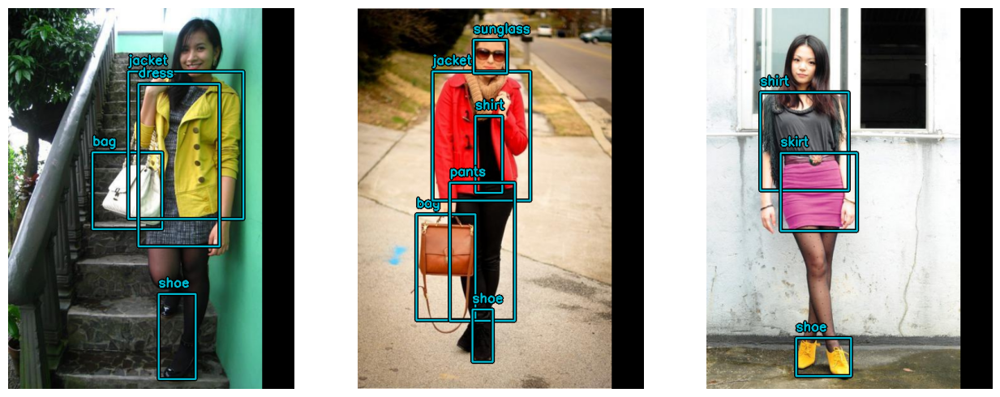

In [ ]:
# visualize training dataset
visualize_dataset(
    train_ds, bounding_box_format=bounding_box_format, value_range=(0, 255), rows=1, cols=3
)

## Visualize Validation Dataset

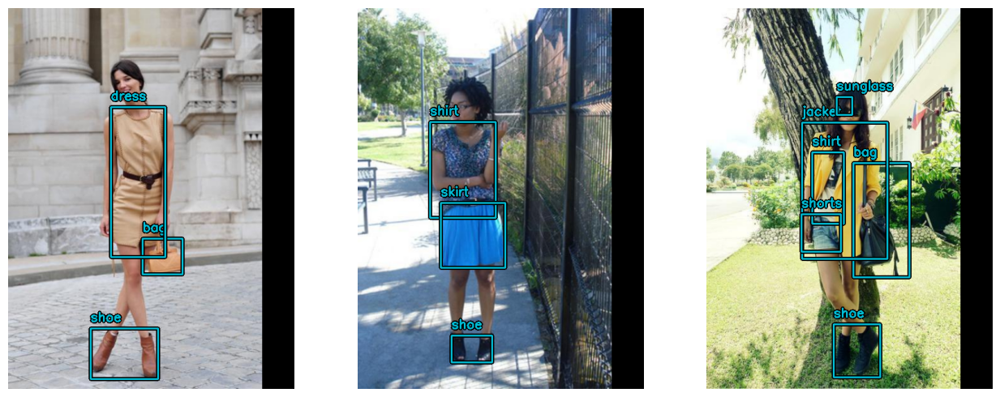

In [ ]:
# visualize validation dataset
visualize_dataset(
    val_ds, bounding_box_format=bounding_box_format, value_range=(0, 255), rows=1, cols=3
)

# Modeling

## Prepare Common Parameters

### Model Save/Load Functions

In [ ]:
# function to save model to gdrive location
def save_model(model, model_num):

        # filepath
        filepath = '/content/drive/MyDrive/models/fashion_model/'

        # save model
        model.save((filepath + f"fashion_model{model_num}.keras"), overwrite=True)

# function to load model from gdrive location
def load_model(model_num):

        # path to saved model
        filepath = f"/content/drive/MyDrive/models/fashion_model/fashion_model{model_num}.keras"

        # load model
        loaded_model = tf.keras.saving.load_model(filepath)

        return loaded_model

### Declare Constants

In [ ]:
NUM_CLASSES = len(class_ids) # 10 total
NUM_EPOCHS = 30 # initial training
NUM_EPOCHS_TUNING = 2 # fine-tuning

### Define Callbacks/Metrics

In [ ]:
# class for visualizing detections
class VisualizeDetections(Callback):
    def on_epoch_end(self, epoch, logs):
        if epoch == 0 or (epoch+1) % 5 == 0:
            visualize_detections(
                model=self.model,
                bounding_box_format=bounding_box_format,
                dataset=val_ds
            )


# class for custom COCO metrics
class EvaluateCOCOMetricsCallback(Callback):
    def __init__(self, data):
        super().__init__()
        self.data = data
        self.metrics = BoxCOCOMetrics(
            bounding_box_format=bounding_box_format,
            evaluate_freq=1e9,
        )
        self.metrics_history = []


    def on_epoch_end(self, epoch, logs):
        self.metrics.reset_state()
        for batch in tqdm(self.data):
            images, y_true = batch[0], batch[1]
            y_pred = self.model.predict(images, verbose=0)

            # ragged tensor workaround
            y_pred = keras_cv.bounding_box.to_dense(y_pred, max_boxes=NUM_CLASSES)
            y_true = keras_cv.bounding_box.to_dense(y_true, max_boxes=NUM_CLASSES)

            self.metrics.update_state(y_true, y_pred)

        metrics = self.metrics.result(force=True)
        logs.update(metrics)

        # store metrics in history
        self.metrics_history.append(metrics)

        return logs


    def on_test_end(self, logs):
        self.metrics.reset_state()
        for batch in tqdm(self.data):
            images, y_true = batch[0], batch[1]
            y_pred = self.model.predict(images, verbose=0)

            # ragged tensor workaround
            y_pred = keras_cv.bounding_box.to_dense(y_pred, max_boxes=NUM_CLASSES)
            y_true = keras_cv.bounding_box.to_dense(y_true, max_boxes=NUM_CLASSES)

            self.metrics.update_state(y_true, y_pred)

        metrics = self.metrics.result(force=True)
        logs.update(metrics)

        # store metrics in history
        self.metrics_history.append(metrics)

        return logs


# print coco metrics
def print_metrics(metrics_list):

    metrics_dict = metrics_list[0]

    maxlen = max([len(key) for key in metrics_dict.keys()])
    print('Metrics:')
    print("-" * (maxlen + 1))
    for k, v in metrics_dict.items():
        print(f"{k.ljust(maxlen+1)}: {v.numpy():0.2f}")


# define path to save model checkpoints
checkpoint_path = '/content/tmp/ckpt/checkpoint.weights.h5'

# define checkpoint callback to only save best model
checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    verbose=0
)

# early stopping callback
early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    min_delta=1e-2,
    patience=7,
    verbose=1,
    mode='min'
)

# reduce learning rate callback
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=2,
    verbose=1,
    mode='min'
)

# define callback to print losses during training
losses_training_callback = LambdaCallback(
    on_epoch_end=lambda epoch, logs:
        print(f"\nEpoch {epoch + 1}/{NUM_EPOCHS} \n" +
              f"train_total_loss: {logs['loss']:0.4f} - " +
              f"train_box_loss: {logs['box_loss']:0.4f} - " +
              f"train_classification_loss: {logs['classification_loss']:0.4f} - " +
              f"val_total_loss: {logs['val_loss']:0.4f} - " +
              f"val_box_loss: {logs['val_box_loss']:0.4f} - " +
              f"val_classification_loss: {logs['val_classification_loss']:0.4f}"
        )
)

# define callback to print losses during fine-tuning
losses_tuning_callback = LambdaCallback(
    on_epoch_end=lambda epoch, logs:
        print(f"\nEpoch {epoch + 1}/{NUM_EPOCHS_TUNING} \n" +
              f"train_total_loss: {logs['loss']:0.4f} - " +
              f"train_box_loss: {logs['box_loss']:0.4f} - " +
              f"train_classification_loss: {logs['classification_loss']:0.4f} - " +
              f"val_total_loss: {logs['val_loss']:0.4f} - " +
              f"val_box_loss: {logs['val_box_loss']:0.4f} - " +
              f"val_classification_loss: {logs['val_classification_loss']:0.4f}"
        )
)

# define callback to print losses during evaluation
losses_eval_callback = LambdaCallback(
    on_test_end=lambda logs:
        print('Losses: \n' +
              ('-' * ((len('Classification (Focal Loss):')))) + '\n' +
              f"Box Regression (Smooth L1 Loss) : {logs['box_loss']:0.2f} \n" +
              f"Classification (Focal Loss)     : {logs['classification_loss']:0.2f} \n"
        )
)

# compute custom metrics
validation_callback = EvaluateCOCOMetricsCallback(val_ds)

# visualize results after each epoch
# helps to visualize inference improvement during training
# visualization_callback = VisualizeDetections() # use when desired

# create custom callbacks lists

# for training
train_callbacks = [checkpoint_callback,
                   validation_callback,
                   losses_training_callback,
                   reduce_lr_callback,
                   early_stopping_callback,
                   #visualization_callback
]

# for fine-tuning
ft_callbacks = [checkpoint_callback,
                   validation_callback,
                   losses_tuning_callback,
                   reduce_lr_callback,
                   early_stopping_callback,
]

# for evaluation
eval_callbacks = [validation_callback,
                  losses_eval_callback
]

## Model 1 - RetinaNet Model

### Build and Train

In [ ]:
# define optimizer
optimizer = SGD(
    learning_rate=0.01,
    momentum=0.9,
    global_clipnorm=10.0
)

# define backbone model - ResNet50_Imagenet
backbone = keras_cv.models.ResNetBackbone.from_preset('resnet50_imagenet')

# build RetinaNet model using backbone
model = keras_cv.models.RetinaNet(
    backbone=backbone,
    num_classes=NUM_CLASSES,
    bounding_box_format=bounding_box_format,
)

# keep false to only train new model top
model.backbone.trainable = False

# compile the model
model.compile(
    classification_loss='focal',
    box_loss='smoothl1',
    optimizer=optimizer,
    metrics=None, # using custom metrics
)

# trian the model
history1 = model.fit(train_ds, validation_data=val_ds, epochs=NUM_EPOCHS, callbacks=train_callbacks, verbose=0)

100%|██████████| 26/26 [01:43<00:00,  3.97s/it]



Epoch 1/30 
train_total_loss: 1.1227 - train_box_loss: 0.5467 - train_classification_loss: 0.5761 - val_total_loss: 0.8225 - val_box_loss: 0.4321 - val_classification_loss: 0.3904


100%|██████████| 26/26 [01:43<00:00,  3.97s/it]



Epoch 2/30 
train_total_loss: 0.7284 - train_box_loss: 0.3784 - train_classification_loss: 0.3500 - val_total_loss: 0.6938 - val_box_loss: 0.3538 - val_classification_loss: 0.3399


100%|██████████| 26/26 [01:44<00:00,  4.00s/it]



Epoch 3/30 
train_total_loss: 0.6279 - train_box_loss: 0.3249 - train_classification_loss: 0.3030 - val_total_loss: 0.6424 - val_box_loss: 0.3318 - val_classification_loss: 0.3107


100%|██████████| 26/26 [01:43<00:00,  4.00s/it]



Epoch 4/30 
train_total_loss: 0.5670 - train_box_loss: 0.2929 - train_classification_loss: 0.2741 - val_total_loss: 0.6029 - val_box_loss: 0.3154 - val_classification_loss: 0.2875


100%|██████████| 26/26 [01:43<00:00,  3.98s/it]



Epoch 5/30 
train_total_loss: 0.5240 - train_box_loss: 0.2686 - train_classification_loss: 0.2553 - val_total_loss: 0.5892 - val_box_loss: 0.3071 - val_classification_loss: 0.2822


100%|██████████| 26/26 [01:44<00:00,  4.03s/it]



Epoch 6/30 
train_total_loss: 0.4848 - train_box_loss: 0.2497 - train_classification_loss: 0.2352 - val_total_loss: 0.5754 - val_box_loss: 0.2997 - val_classification_loss: 0.2757


100%|██████████| 26/26 [01:43<00:00,  3.97s/it]



Epoch 7/30 
train_total_loss: 0.4542 - train_box_loss: 0.2329 - train_classification_loss: 0.2213 - val_total_loss: 0.5732 - val_box_loss: 0.2965 - val_classification_loss: 0.2767


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 8/30 
train_total_loss: 0.4314 - train_box_loss: 0.2174 - train_classification_loss: 0.2140 - val_total_loss: 0.5693 - val_box_loss: 0.2960 - val_classification_loss: 0.2733


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 9/30 
train_total_loss: 0.3998 - train_box_loss: 0.2029 - train_classification_loss: 0.1969 - val_total_loss: 0.5763 - val_box_loss: 0.2954 - val_classification_loss: 0.2809


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 10/30 
train_total_loss: 0.3765 - train_box_loss: 0.1889 - train_classification_loss: 0.1876 - val_total_loss: 0.5735 - val_box_loss: 0.2995 - val_classification_loss: 0.2740

Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0019999999552965165.


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 11/30 
train_total_loss: 0.3382 - train_box_loss: 0.1699 - train_classification_loss: 0.1683 - val_total_loss: 0.5638 - val_box_loss: 0.2951 - val_classification_loss: 0.2687


100%|██████████| 26/26 [01:43<00:00,  4.00s/it]



Epoch 12/30 
train_total_loss: 0.3226 - train_box_loss: 0.1625 - train_classification_loss: 0.1601 - val_total_loss: 0.5661 - val_box_loss: 0.2958 - val_classification_loss: 0.2703


100%|██████████| 26/26 [01:43<00:00,  4.00s/it]



Epoch 13/30 
train_total_loss: 0.3160 - train_box_loss: 0.1590 - train_classification_loss: 0.1570 - val_total_loss: 0.5688 - val_box_loss: 0.2971 - val_classification_loss: 0.2717

Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0003999999724328518.


100%|██████████| 26/26 [01:44<00:00,  4.03s/it]



Epoch 14/30 
train_total_loss: 0.3078 - train_box_loss: 0.1549 - train_classification_loss: 0.1529 - val_total_loss: 0.5654 - val_box_loss: 0.2953 - val_classification_loss: 0.2701


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 15/30 
train_total_loss: 0.3045 - train_box_loss: 0.1531 - train_classification_loss: 0.1515 - val_total_loss: 0.5658 - val_box_loss: 0.2955 - val_classification_loss: 0.2703

Epoch 15: ReduceLROnPlateau reducing learning rate to 7.999999215826393e-05.


100%|██████████| 26/26 [01:43<00:00,  3.98s/it]



Epoch 16/30 
train_total_loss: 0.3023 - train_box_loss: 0.1519 - train_classification_loss: 0.1504 - val_total_loss: 0.5641 - val_box_loss: 0.2950 - val_classification_loss: 0.2691


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 17/30 
train_total_loss: 0.3019 - train_box_loss: 0.1517 - train_classification_loss: 0.1502 - val_total_loss: 0.5640 - val_box_loss: 0.2949 - val_classification_loss: 0.2691

Epoch 17: ReduceLROnPlateau reducing learning rate to 1.599999814061448e-05.


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 18/30 
train_total_loss: 0.3011 - train_box_loss: 0.1512 - train_classification_loss: 0.1499 - val_total_loss: 0.5642 - val_box_loss: 0.2950 - val_classification_loss: 0.2692
Epoch 18: early stopping


### Save Model

In [ ]:
# save model 1 - RetinaNet model
save_model(model, model_num=1)

### Draw Learning Curve

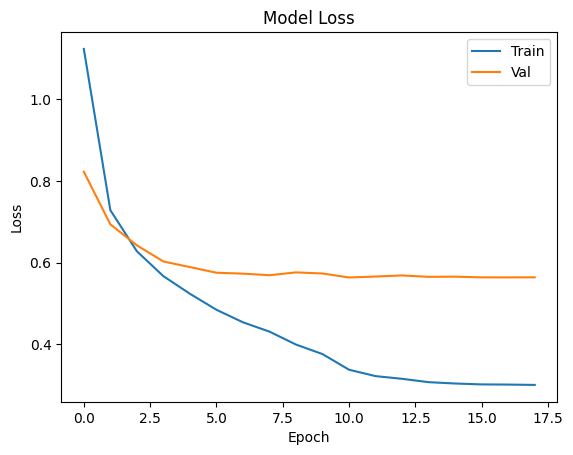

In [ ]:
# define function to draw learning curves
def learning_curve(hist):

    # plot model loss
    plt.plot(hist.history['loss'])
    plt.plot(hist.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper right')

    # show plot
    plt.show()

# call function to draw learning curve
learning_curve(history1)

### Evaluate Validation Dataset

In [ ]:
# evaluate validation set
validation_callback = EvaluateCOCOMetricsCallback(val_ds)
val_loss = model.evaluate(val_ds, verbose=0, callbacks=[validation_callback, losses_eval_callback])

# print validation metrics
print_metrics(validation_callback.metrics_history)

100%|██████████| 26/26 [01:46<00:00,  4.08s/it]


Losses: 
----------------------------
Box Regression (Smooth L1 Loss) : 0.29 
Classification (Focal Loss)     : 0.27 

Metrics:
----------------------------
MaP                         : 0.28
MaP@[IoU=50]                : 0.59
MaP@[IoU=75]                : 0.23
MaP@[area=small]            : 0.01
MaP@[area=medium]           : 0.13
MaP@[area=large]            : 0.36
Recall@[max_detections=1]   : 0.34
Recall@[max_detections=10]  : 0.35
Recall@[max_detections=100] : 0.35
Recall@[area=small]         : 0.01
Recall@[area=medium]        : 0.17
Recall@[area=large]         : 0.43


### Evaluate Test Dataset

In [ ]:
# evaluate test set
test_callback = EvaluateCOCOMetricsCallback(test_ds)
test_loss = model.evaluate(test_ds, verbose=0, callbacks=[test_callback, losses_eval_callback])

# print test metrics
print_metrics(test_callback.metrics_history)

100%|██████████| 33/33 [02:11<00:00,  3.99s/it]


Losses: 
----------------------------
Box Regression (Smooth L1 Loss) : 0.29 
Classification (Focal Loss)     : 0.28 

Metrics:
----------------------------
MaP                         : 0.27
MaP@[IoU=50]                : 0.58
MaP@[IoU=75]                : 0.22
MaP@[area=small]            : 0.00
MaP@[area=medium]           : 0.14
MaP@[area=large]            : 0.29
Recall@[max_detections=1]   : 0.35
Recall@[max_detections=10]  : 0.35
Recall@[max_detections=100] : 0.35
Recall@[area=small]         : 0.00
Recall@[area=medium]        : 0.18
Recall@[area=large]         : 0.36


### Model Summary

In [ ]:
# print model summary
print(model.summary())

Model: "retina_net_16"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 images (InputLayer)         [(None, None, None, 3)]      0         []                            
                                                                                                  
 model_16 (Functional)       {'P3': (None, None, None,    2356115   ['images[0][0]']              
                             512),                        2                                       
                              'P4': (None, None, None,                                            
                             1024),                                                               
                              'P5': (None, None, None,                                            
                             2048)}                                                   

### Inference on Test Images




1/1 [==============================] - 3s 3s/step


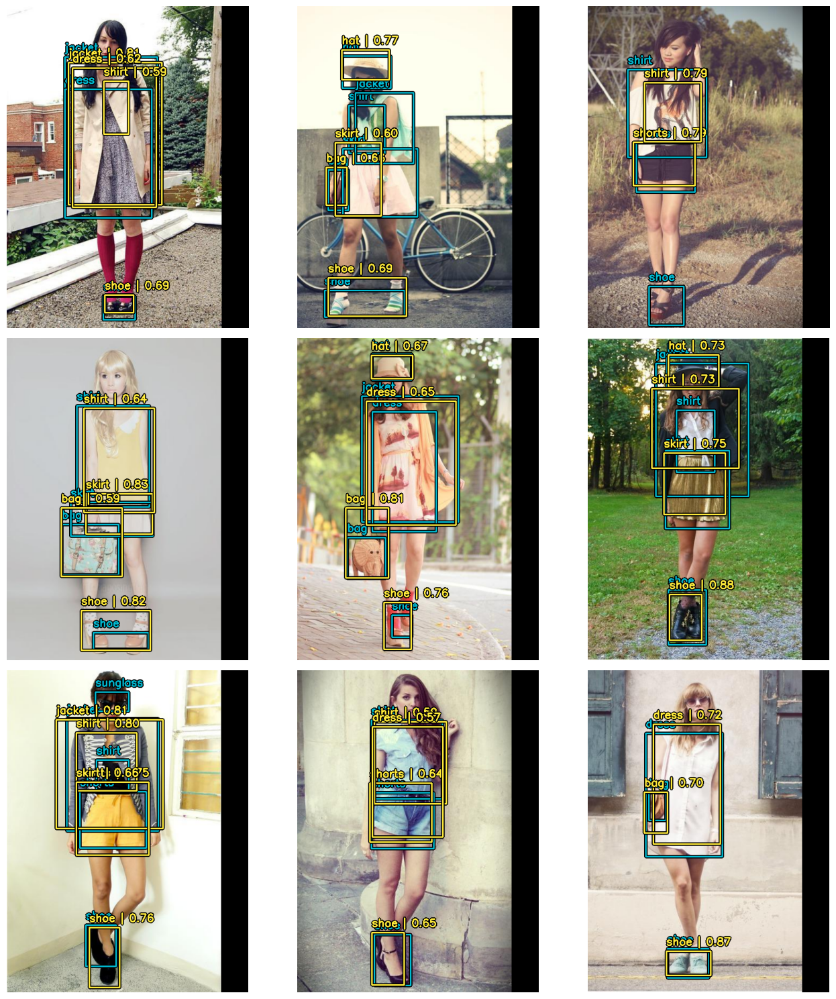

In [ ]:
# enable NMS, tune for best results
model.prediction_decoder = MultiClassNonMaxSuppression(
    bounding_box_format=bounding_box_format,
    from_logits=True,
    iou_threshold=0.2,
    confidence_threshold=0.55,
)

# visualize detections, including ground truth bounding boxes
visualize_detections(model, dataset=test_ds, bounding_box_format=bounding_box_format)

## Model 2 - With Data Augmentation

### Data Augmentation

In [ ]:
# random cutout augmentation
def augment_randcut(image, label):
    randcut = keras_cv.layers.RandomCutout(
        height_factor=0.25, width_factor=0.25, fill_mode='gaussian_noise'
)
    augmented_image=(randcut(image))
    return augmented_image, label


# random color degeneration augmentation
def augment_rand_color_degen(image, label):
    rand_color_degen = keras_cv.layers.RandomColorDegeneration(
        factor=(1.0), seed=seed
)
    augmented_image=(rand_color_degen(image))
    return augmented_image, label


# gridmask augmentation
def augment_gridmask(image, label):
    gridmask = keras_cv.layers.GridMask(
        ratio_factor = (0.1, 0.5), rotation_factor = 0.15
    )
    augmented_image=(gridmask(image))
    return augmented_image, label


# perform augmentations - random cutout, random color degeneration, and random gridmask
train_ds_randcut = train_ds.map(augment_randcut, num_parallel_calls=tf.data.AUTOTUNE)
train_ds_rand_color_degen = train_ds.map(augment_rand_color_degen, num_parallel_calls=tf.data.AUTOTUNE)
train_ds_gridmask = train_ds.map(augment_gridmask, num_parallel_calls=tf.data.AUTOTUNE)

# combine results into a single training dataset
train_ds_augmented = (
    train_ds.concatenate(train_ds_randcut.concatenate(train_ds_rand_color_degen.concatenate(train_ds_gridmask)))
)

# prefetch data prior to training for performance
train_ds_augmented = train_ds_augmented.prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

# print lengths of training dataset before and after augmentation
len_train_ds = tf.data.experimental.cardinality(train_ds).numpy() * BATCH_SIZE
len_train_ds_augmented = tf.data.experimental.cardinality(train_ds_augmented).numpy() * BATCH_SIZE
print(f"{len_train_ds} samples before augmentation")
print(f"{len_train_ds_augmented} samples after augmentation")

1712 samples before augmentation
6848 samples after augmentation


#### Random Cutout

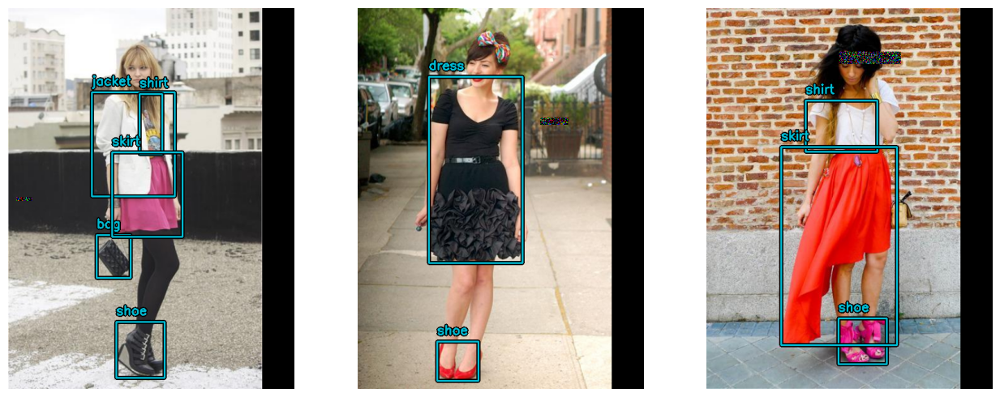

In [ ]:
# visualize random cutout augmentation effects
visualize_dataset(
    train_ds_randcut, bounding_box_format=bounding_box_format, value_range=(0, 255), rows=1, cols=3
)

#### Color Degeneration

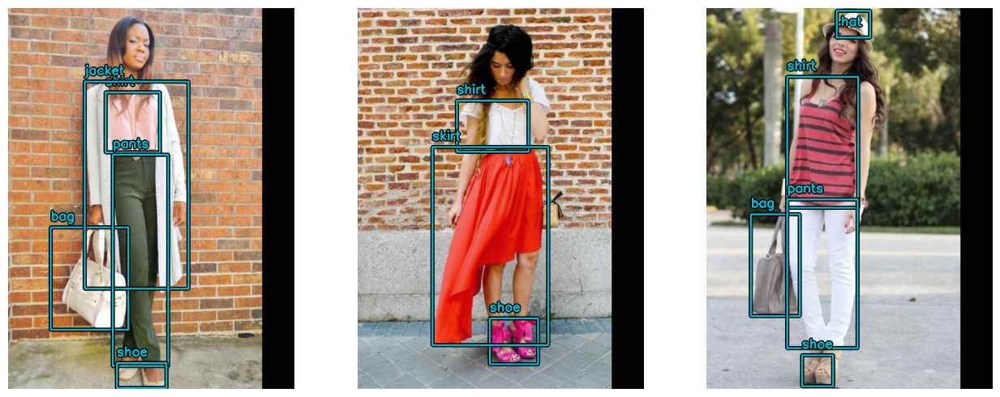

In [ ]:
# visualize random color degeneration augmentation effects
visualize_dataset(
    train_ds_rand_color_degen, bounding_box_format=bounding_box_format, value_range=(0, 255), rows=1, cols=3
)

#### Grid Mask

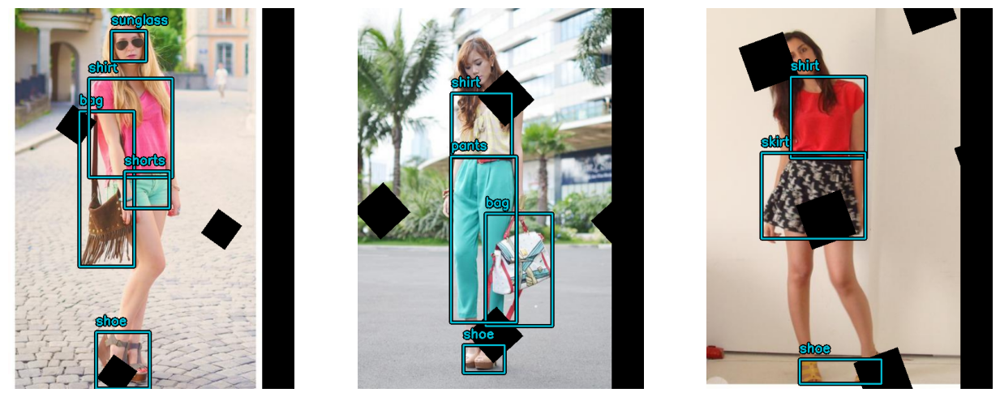

In [ ]:
# visualize gridmask augmentation effects
visualize_dataset(
    train_ds_gridmask, bounding_box_format=bounding_box_format, value_range=(0, 255), rows=1, cols=3
)

#### Build and Train

In [ ]:
# define backbone model - ResNet50_Imagenet
backbone = keras_cv.models.ResNetBackbone.from_preset('resnet50_imagenet')

# build RetinaNet model using backbone
model = keras_cv.models.RetinaNet(
    backbone=backbone,
    num_classes=NUM_CLASSES,
    bounding_box_format=bounding_box_format,
)
# keep false to only train new model top
model.backbone.trainable = False

# compile the model
model.compile(
    classification_loss='focal',
    box_loss='smoothl1',
    optimizer=optimizer,
    metrics=None, # using custom metrics
)

# trian the model
history2 = model.fit(train_ds_augmented, validation_data=val_ds, epochs=NUM_EPOCHS, callbacks=train_callbacks, verbose=0)

100%|██████████| 26/26 [01:43<00:00,  4.00s/it]



Epoch 1/30 
train_total_loss: 0.7942 - train_box_loss: 0.3988 - train_classification_loss: 0.3955 - val_total_loss: 0.6114 - val_box_loss: 0.3163 - val_classification_loss: 0.2951


100%|██████████| 26/26 [01:43<00:00,  4.00s/it]



Epoch 2/30 
train_total_loss: 0.5222 - train_box_loss: 0.2682 - train_classification_loss: 0.2540 - val_total_loss: 0.5608 - val_box_loss: 0.2941 - val_classification_loss: 0.2666


100%|██████████| 26/26 [01:43<00:00,  4.00s/it]



Epoch 3/30 
train_total_loss: 0.4312 - train_box_loss: 0.2198 - train_classification_loss: 0.2114 - val_total_loss: 0.5554 - val_box_loss: 0.2915 - val_classification_loss: 0.2639


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 4/30 
train_total_loss: 0.3619 - train_box_loss: 0.1830 - train_classification_loss: 0.1790 - val_total_loss: 0.5577 - val_box_loss: 0.2900 - val_classification_loss: 0.2678


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 5/30 
train_total_loss: 0.3100 - train_box_loss: 0.1551 - train_classification_loss: 0.1549 - val_total_loss: 0.5663 - val_box_loss: 0.2888 - val_classification_loss: 0.2774

Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0019999999552965165.


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 6/30 
train_total_loss: 0.2632 - train_box_loss: 0.1322 - train_classification_loss: 0.1310 - val_total_loss: 0.5633 - val_box_loss: 0.2874 - val_classification_loss: 0.2759


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 7/30 
train_total_loss: 0.2485 - train_box_loss: 0.1249 - train_classification_loss: 0.1236 - val_total_loss: 0.5698 - val_box_loss: 0.2878 - val_classification_loss: 0.2820

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0003999999724328518.


100%|██████████| 26/26 [01:43<00:00,  3.99s/it]



Epoch 8/30 
train_total_loss: 0.2364 - train_box_loss: 0.1190 - train_classification_loss: 0.1174 - val_total_loss: 0.5706 - val_box_loss: 0.2869 - val_classification_loss: 0.2836


100%|██████████| 26/26 [01:43<00:00,  4.00s/it]



Epoch 9/30 
train_total_loss: 0.2330 - train_box_loss: 0.1175 - train_classification_loss: 0.1154 - val_total_loss: 0.5736 - val_box_loss: 0.2878 - val_classification_loss: 0.2858

Epoch 9: ReduceLROnPlateau reducing learning rate to 7.999999215826393e-05.
Epoch 9: early stopping


### Save Model

In [ ]:
# save model 2 - RetinaNet with Augmentation
save_model(model, model_num=2)

### Draw Learning Curve

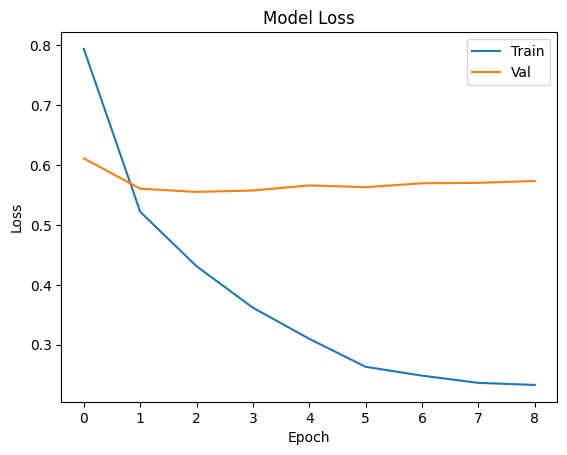

In [ ]:
# call function to draw learning curve
learning_curve(history2)

### Evaluate Validation Dataset

In [ ]:
# evaluate validation set
validation_callback = EvaluateCOCOMetricsCallback(val_ds)
val_loss = model.evaluate(val_ds, verbose=0, callbacks=[validation_callback, losses_eval_callback])

# print validation metrics
print_metrics(validation_callback.metrics_history)

100%|██████████| 26/26 [01:44<00:00,  4.04s/it]


Losses: 
----------------------------
Box Regression (Smooth L1 Loss) : 0.29 
Classification (Focal Loss)     : 0.29 

Metrics:
----------------------------
MaP                         : 0.29
MaP@[IoU=50]                : 0.60
MaP@[IoU=75]                : 0.25
MaP@[area=small]            : 0.01
MaP@[area=medium]           : 0.14
MaP@[area=large]            : 0.39
Recall@[max_detections=1]   : 0.36
Recall@[max_detections=10]  : 0.37
Recall@[max_detections=100] : 0.37
Recall@[area=small]         : 0.01
Recall@[area=medium]        : 0.19
Recall@[area=large]         : 0.47


### Evaluate Test Dataset

In [ ]:
# evaluate test set
test_callback = EvaluateCOCOMetricsCallback(test_ds)
test_loss = model.evaluate(test_ds, verbose=0, callbacks=[test_callback, losses_eval_callback])

# print test metrics
print_metrics(test_callback.metrics_history)

100%|██████████| 33/33 [02:11<00:00,  3.98s/it]


Losses: 
----------------------------
Box Regression (Smooth L1 Loss) : 0.29 
Classification (Focal Loss)     : 0.29 

Metrics:
----------------------------
MaP                         : 0.29
MaP@[IoU=50]                : 0.61
MaP@[IoU=75]                : 0.24
MaP@[area=small]            : 0.01
MaP@[area=medium]           : 0.15
MaP@[area=large]            : 0.30
Recall@[max_detections=1]   : 0.36
Recall@[max_detections=10]  : 0.37
Recall@[max_detections=100] : 0.37
Recall@[area=small]         : 0.01
Recall@[area=medium]        : 0.20
Recall@[area=large]         : 0.38


### Inference on Test Images

1/1 [==============================] - 2s 2s/step


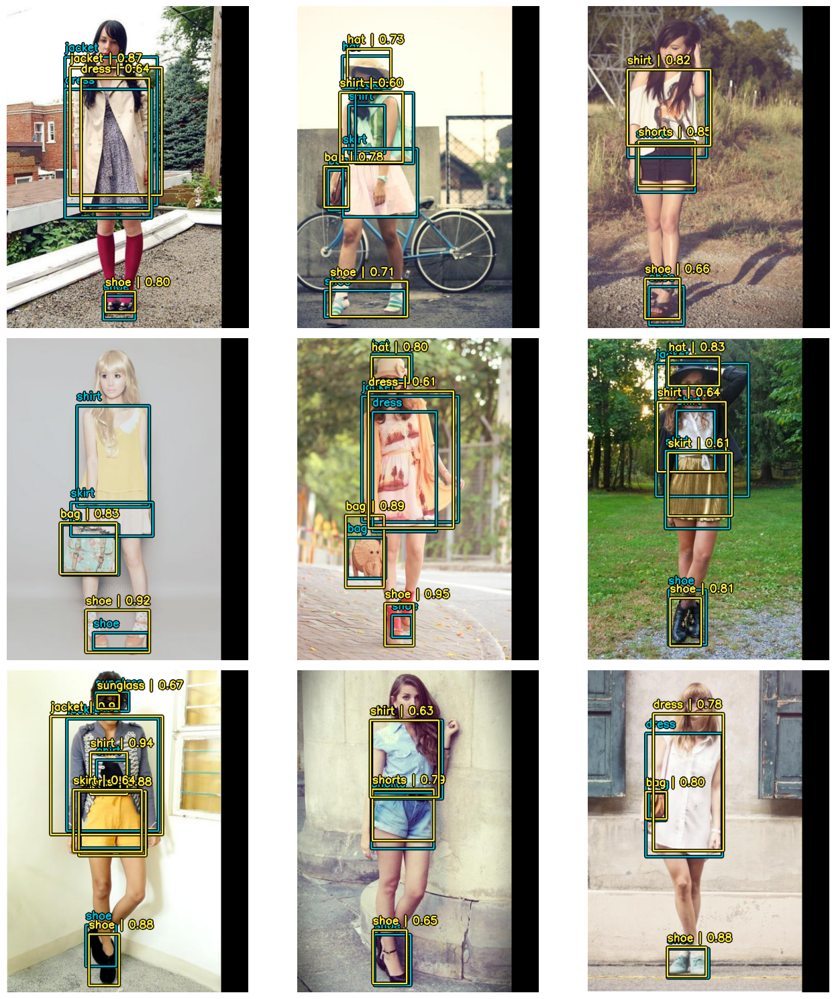

In [ ]:
# enable NMS, tune for best results
model.prediction_decoder = MultiClassNonMaxSuppression(
    bounding_box_format=bounding_box_format,
    from_logits=True,
    iou_threshold=0.2,
    confidence_threshold=0.6,
)

# visualize detections, including ground truth bounding boxes
visualize_detections(model, dataset=test_ds, bounding_box_format=bounding_box_format)

## Model 3 - Fine-Tuning

### Load Saved Model

In [ ]:
# uncomment to load model for fine-tuning
#model = load_model(model_num=2)

### Unfreeze Backbone Layers

In [ ]:
# unfreeze backbone layers for training
model.backbone.trainable = True

# freeze all batch normalization layers
for layer in model.get_layer('model_18').layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False
        # print to verify these layers are not trainable
        print(f"Layer: {layer.name}, Trainable: {layer.trainable}")

Layer: conv1_bn, Trainable: False
Layer: v2_stack_0_block1_1_bn, Trainable: False
Layer: v2_stack_0_block1_2_bn, Trainable: False
Layer: v2_stack_0_block1_0_bn, Trainable: False
Layer: v2_stack_0_block1_3_bn, Trainable: False
Layer: v2_stack_0_block2_1_bn, Trainable: False
Layer: v2_stack_0_block2_2_bn, Trainable: False
Layer: v2_stack_0_block2_3_bn, Trainable: False
Layer: v2_stack_0_block3_1_bn, Trainable: False
Layer: v2_stack_0_block3_2_bn, Trainable: False
Layer: v2_stack_0_block3_3_bn, Trainable: False
Layer: v2_stack_1_block1_1_bn, Trainable: False
Layer: v2_stack_1_block1_2_bn, Trainable: False
Layer: v2_stack_1_block1_0_bn, Trainable: False
Layer: v2_stack_1_block1_3_bn, Trainable: False
Layer: v2_stack_1_block2_1_bn, Trainable: False
Layer: v2_stack_1_block2_2_bn, Trainable: False
Layer: v2_stack_1_block2_3_bn, Trainable: False
Layer: v2_stack_1_block3_1_bn, Trainable: False
Layer: v2_stack_1_block3_2_bn, Trainable: False
Layer: v2_stack_1_block3_3_bn, Trainable: False
Layer:

### Model Summary

In [ ]:
# print model summary, showing trainable layers
model.summary(show_trainable=True)

Model: "retina_net_18"
_____________________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  Trainable  
 images (InputLayer)         [(None, None, None, 3)]      0         []                            Y          
                                                                                                             
 model_18 (Functional)       {'P3': (None, None, None,    2356115   ['images[0][0]']              Y          
                             512),                        2                                                  
                              'P4': (None, None, None,                                                       
                             1024),                                                                          
                              'P5': (None, None, None,                                           

### Model Architecture

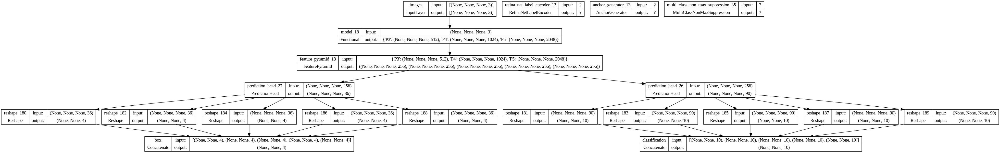

In [ ]:
# plot model architecture
plot_model(model, show_shapes=True)

### Build and Train

In [ ]:
# define optimizer
optimizer = SGD(
    learning_rate=0.00001, # lowered learning rate for fine-tuning
    momentum=0.9,
    global_clipnorm=10.0
)

# compile the model
model.compile(
    classification_loss='focal',
    box_loss='smoothl1',
    optimizer=optimizer,
    metrics=None, # using custom metrics
)

# train the model
history3 = model.fit(train_ds_augmented, validation_data=val_ds, epochs=NUM_EPOCHS_TUNING, callbacks=ft_callbacks, verbose=0)

100%|██████████| 26/26 [00:21<00:00,  1.19it/s]



Epoch 1/2 
train_total_loss: 0.2321 - train_box_loss: 0.1169 - train_classification_loss: 0.1152 - val_total_loss: 0.5707 - val_box_loss: 0.2870 - val_classification_loss: 0.2837


100%|██████████| 26/26 [00:21<00:00,  1.19it/s]



Epoch 2/2 
train_total_loss: 0.2284 - train_box_loss: 0.1149 - train_classification_loss: 0.1134 - val_total_loss: 0.5708 - val_box_loss: 0.2868 - val_classification_loss: 0.2841


### Save Model

In [ ]:
# save model 3 - RetinaNet with Augmentation, fine-tuned
save_model(model, model_num=3)

### Evaluate Validation Dataset

In [ ]:
# evaluate validation set
validation_callback = EvaluateCOCOMetricsCallback(val_ds)
val_loss = model.evaluate(val_ds, verbose=0, callbacks=[validation_callback, losses_eval_callback])

# print validation metrics
print_metrics(validation_callback.metrics_history)

100%|██████████| 26/26 [00:16<00:00,  1.58it/s]


Losses: 
----------------------------
Box Regression (Smooth L1 Loss) : 0.29 
Classification (Focal Loss)     : 0.28 

Metrics:
----------------------------
MaP                         : 0.28
MaP@[IoU=50]                : 0.58
MaP@[IoU=75]                : 0.25
MaP@[area=small]            : 0.02
MaP@[area=medium]           : 0.12
MaP@[area=large]            : 0.37
Recall@[max_detections=1]   : 0.35
Recall@[max_detections=10]  : 0.35
Recall@[max_detections=100] : 0.35
Recall@[area=small]         : 0.02
Recall@[area=medium]        : 0.17
Recall@[area=large]         : 0.45


### Evaluate Test Dataset

In [ ]:
# evaluate test set
test_callback = EvaluateCOCOMetricsCallback(test_ds)
test_loss = model.evaluate(test_ds, verbose=0, callbacks=[test_callback, losses_eval_callback])

# print test metrics
print_metrics(test_callback.metrics_history)

100%|██████████| 33/33 [00:25<00:00,  1.27it/s]


Losses: 
----------------------------
Box Regression (Smooth L1 Loss) : 0.29 
Classification (Focal Loss)     : 0.29 

Metrics:
----------------------------
MaP                         : 0.28
MaP@[IoU=50]                : 0.59
MaP@[IoU=75]                : 0.24
MaP@[area=small]            : 0.00
MaP@[area=medium]           : 0.14
MaP@[area=large]            : 0.30
Recall@[max_detections=1]   : 0.36
Recall@[max_detections=10]  : 0.36
Recall@[max_detections=100] : 0.36
Recall@[area=small]         : 0.00
Recall@[area=medium]        : 0.17
Recall@[area=large]         : 0.38


### Inference on Test Images

1/1 [==============================] - 3s 3s/step


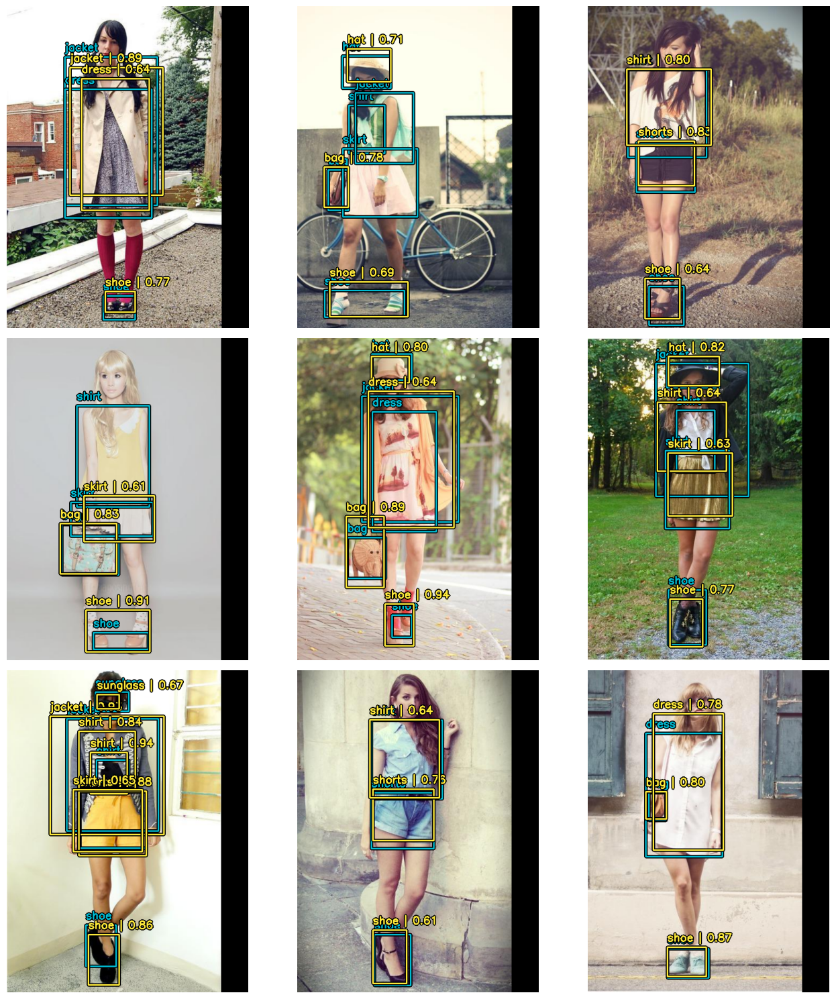

In [171]:
# enable NMS, tune for best results
model.prediction_decoder = MultiClassNonMaxSuppression(
    bounding_box_format=bounding_box_format,
    from_logits=True,
    iou_threshold=0.5,
    confidence_threshold=0.6,
)

# visualize detections, including ground truth bounding boxes
visualize_detections(model, dataset=test_ds, bounding_box_format=bounding_box_format)